## TensorFlow-DeepDream

In this notebook we will implement DeepDream algorithm. 
https://ai.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
#Import InceptionV3 model
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87916544/87910968 [==============================] - 2s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [50]:
#Pick a layer and maximize its activation
names = ['mixed2', 'mixed4']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
deepdream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [5]:
#Mount the drive and get the data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [41]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/trump.jpg', target_size = (225, 375))

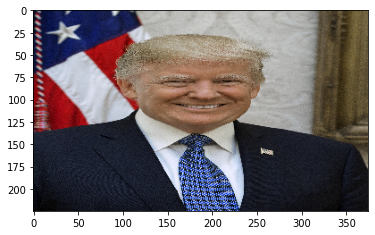

In [42]:
plt.imshow(Sample_Image)

In [43]:
Sample_Image = np.array(Sample_Image)

In [44]:
def calc_loss(img, model):
  # Pass forward the image through the model to retrieve the activations.
  # Converts the image into a batch of size 1.
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return  tf.reduce_sum(losses)

In [45]:
class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.float32),)
  )
  def __call__(self, img, steps, step_size):
      print("Tracing")
      loss = tf.constant(0.0)
      for n in tf.range(steps):
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img`
          # `GradientTape` only watches `tf.Variable`s by default
          tape.watch(img)
          loss = calc_loss(img, self.model)

        # Calculate the gradient of the loss with respect to the pixels of the input image.
        gradients = tape.gradient(loss, img)

        # Normalize the gradients.
        gradients /= tf.math.reduce_std(gradients) + 1e-8 
        
        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # You can update the image by directly adding the gradients (because they're the same shape!)
        img = img + gradients*step_size
        img = tf.clip_by_value(img, -1, 1)

      return loss, img

In [46]:
deepdream = DeepDream(deepdream_model)

In [47]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

In [48]:
def run_deep_dream_simple(model, img, steps=100, step_size=0.01):
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(img))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  plt.imshow(result)

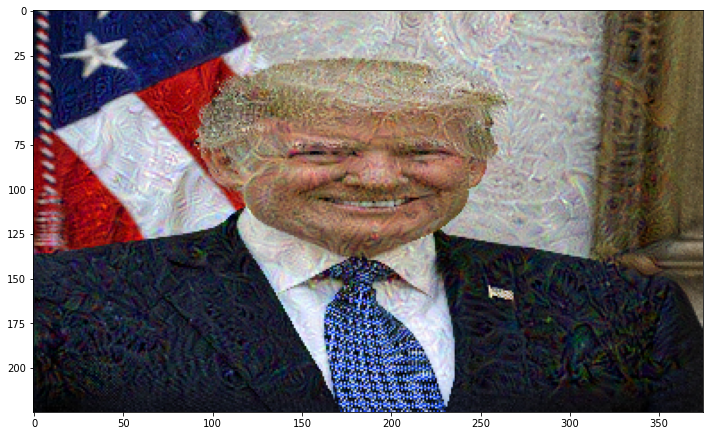

Step 100, loss 0.8606051206588745


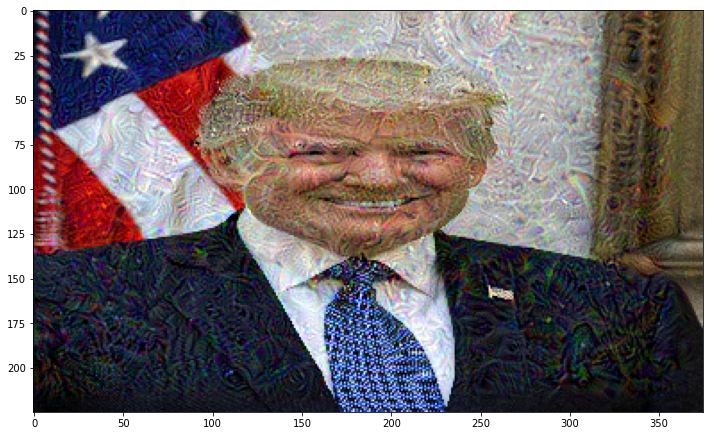

Step 200, loss 1.0645456314086914


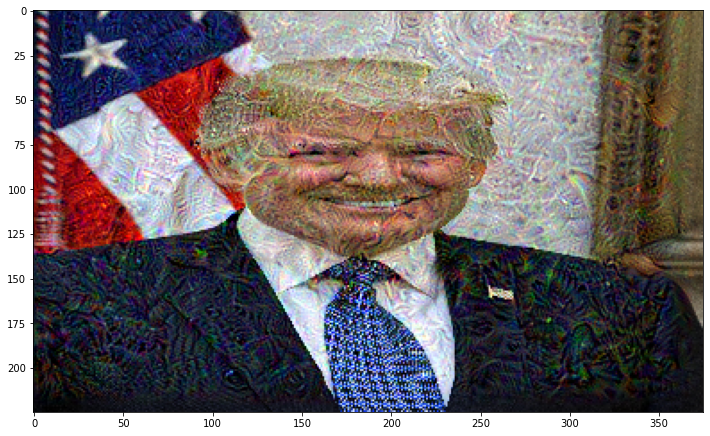

Step 300, loss 1.1871100664138794


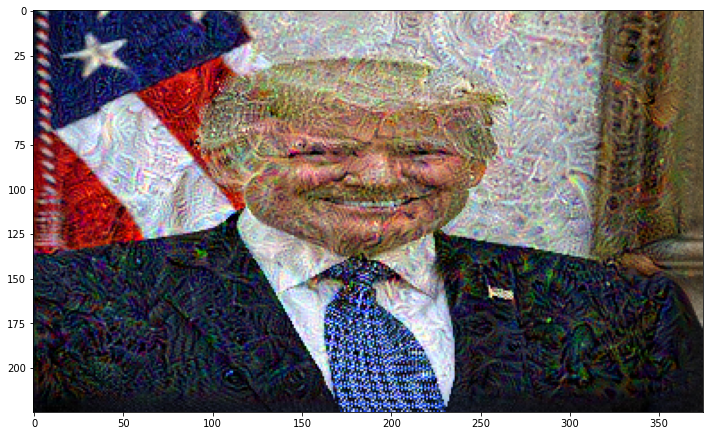

Step 400, loss 1.2739439010620117


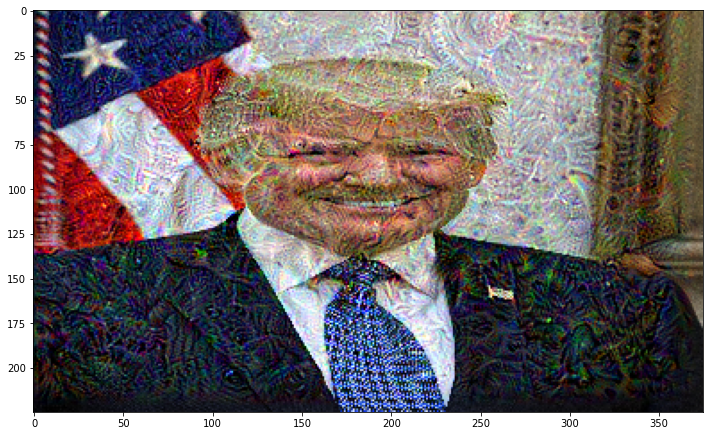

Step 500, loss 1.3458306789398193


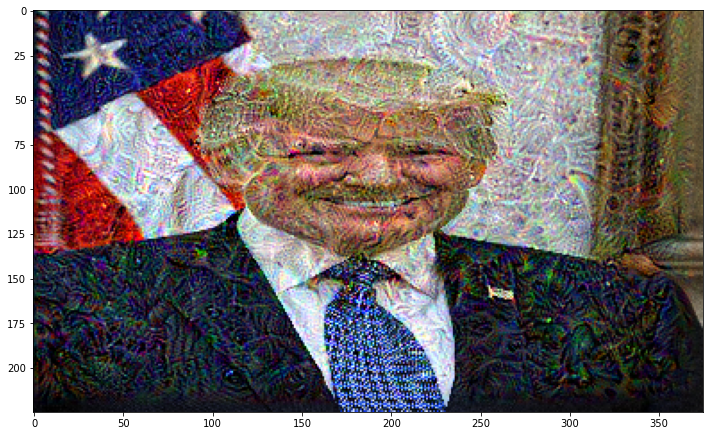

Step 600, loss 1.4000723361968994


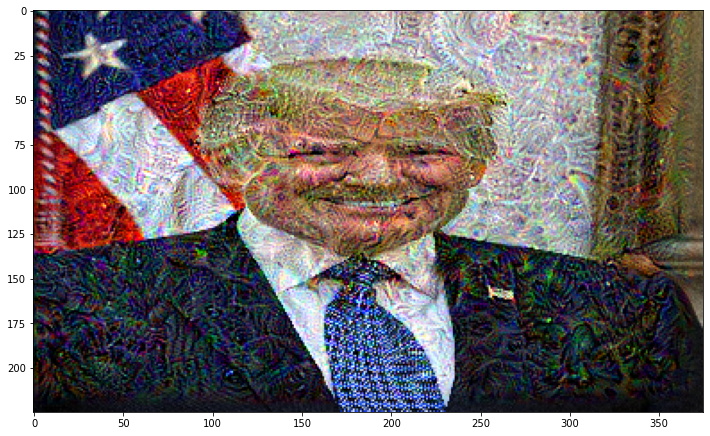

Step 700, loss 1.4364975690841675


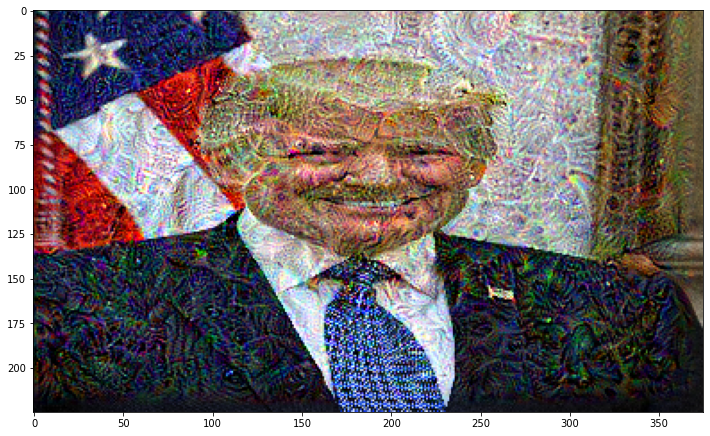

Step 800, loss 1.4706789255142212


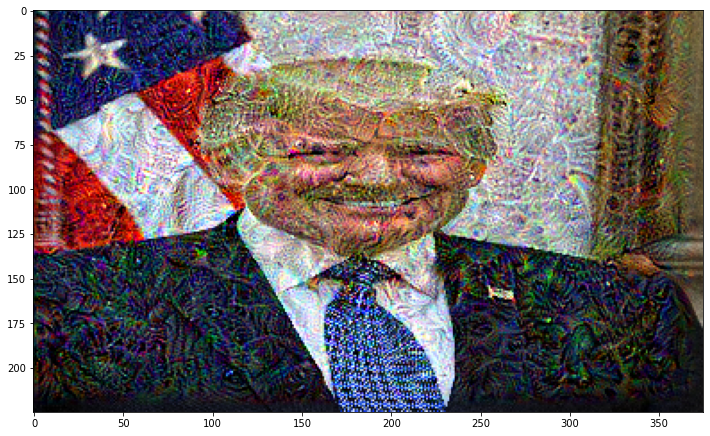

Step 900, loss 1.4905705451965332


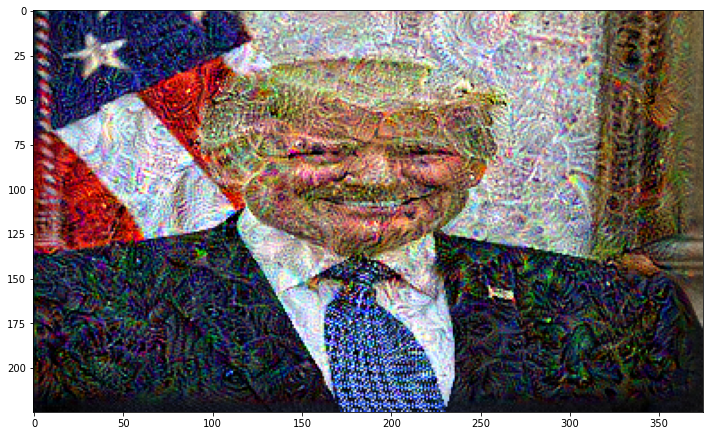

Step 1000, loss 1.5219752788543701


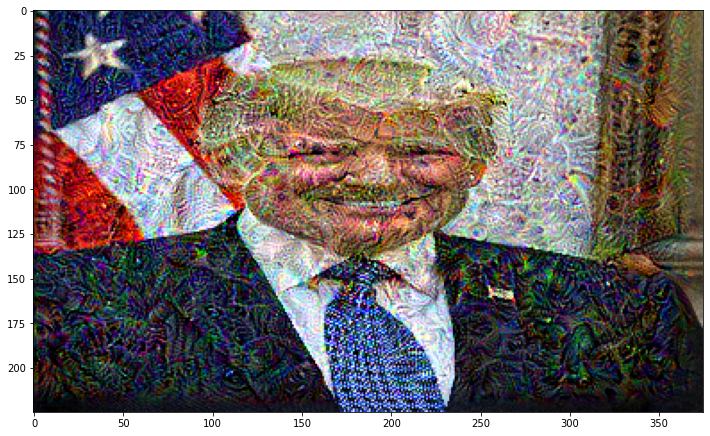

Step 1100, loss 1.5413503646850586


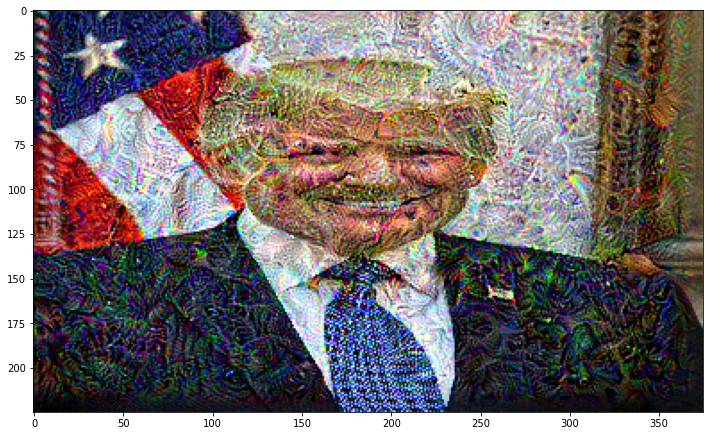

Step 1200, loss 1.5671581029891968


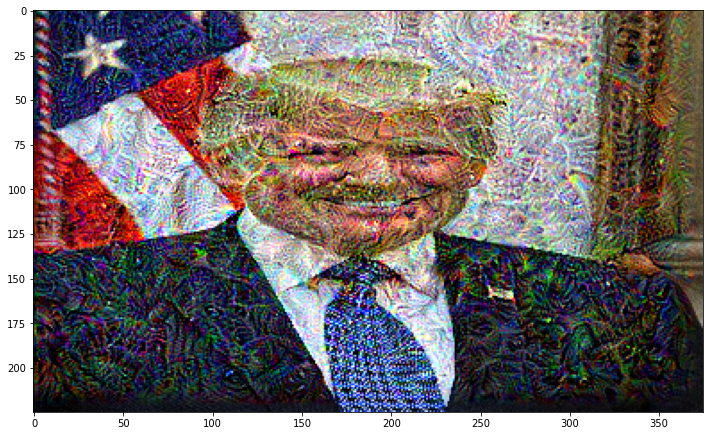

Step 1300, loss 1.5836249589920044


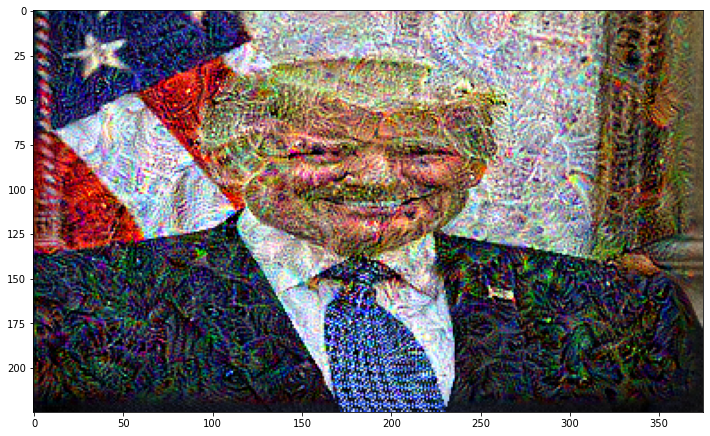

Step 1400, loss 1.604368805885315


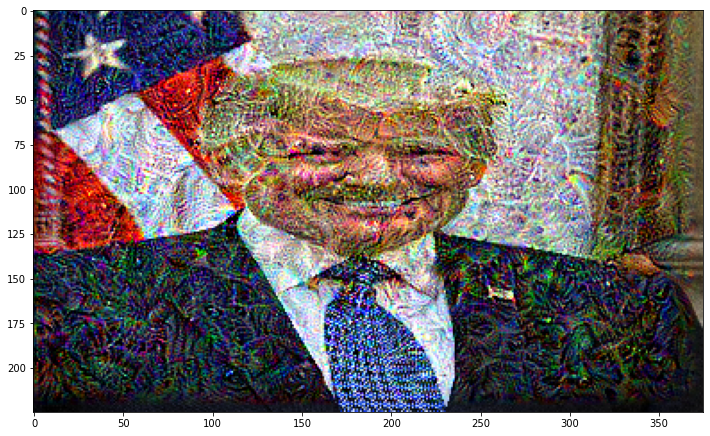

Step 1500, loss 1.620642900466919


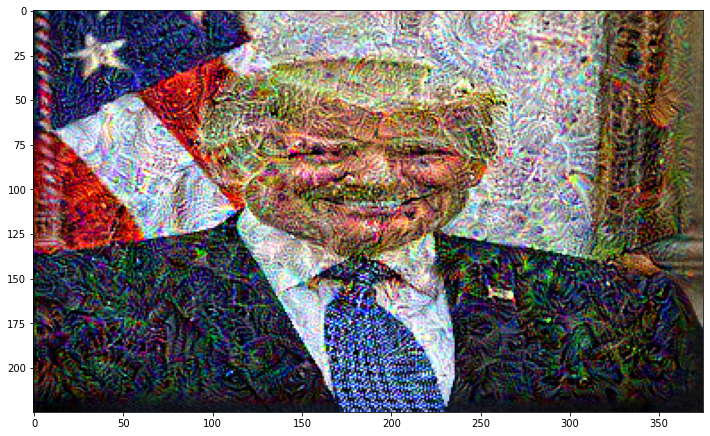

Step 1600, loss 1.6253776550292969


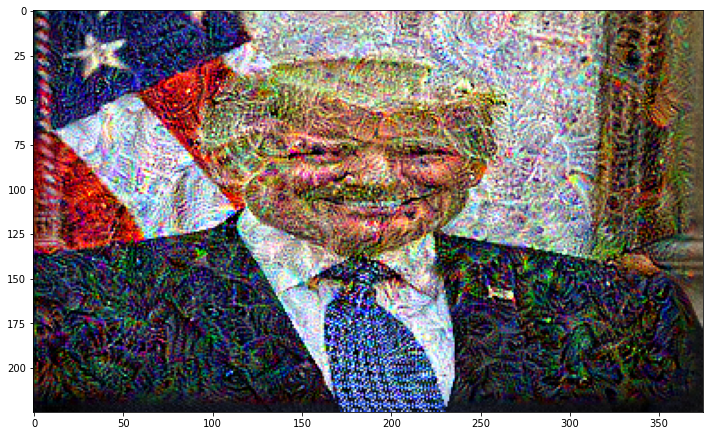

Step 1700, loss 1.6506739854812622


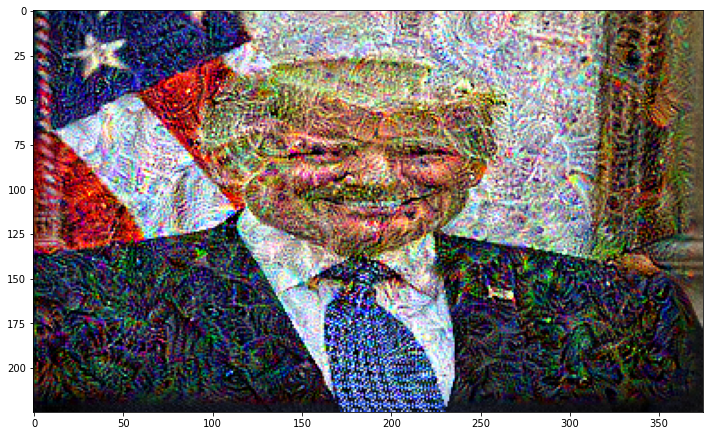

Step 1800, loss 1.6567773818969727


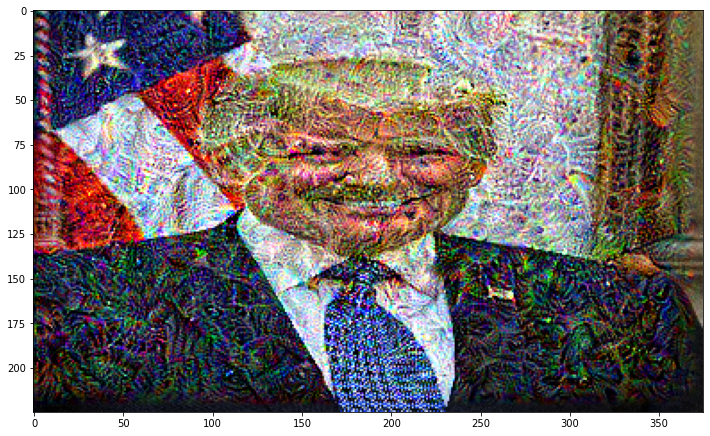

Step 1900, loss 1.6677459478378296


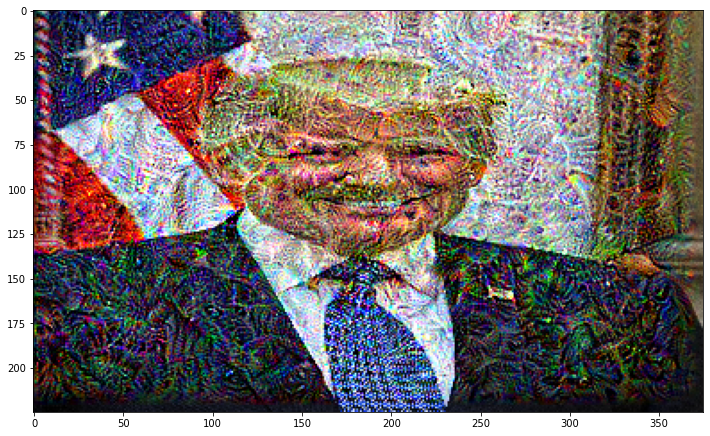

Step 2000, loss 1.6770190000534058


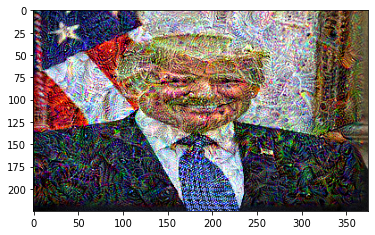

In [52]:
dream_img = run_deep_dream_simple(model=deepdream_model, img=Sample_Image, 
                                  steps=2000, step_size=0.01)

You can see at these layers model is still getting activated with things like edges etc.